In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import torchvision
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from tqdm.notebook import tqdm
import math
import os
from glob import glob

In [2]:
DIR = '/kaggle/input/animefacedataset'
image_size = 128
batch_size = 256
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [3]:
transform = transforms.Compose([
    transforms.Resize(image_size),  
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])
# Create a Dataset object using your image directory and transforms
dataset = torchvision.datasets.ImageFolder(
    DIR,
    transform=transform
)

# Create a DataLoader object to load batches of data  
train_dataset = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=3, 
    pin_memory=True
)

In [4]:
# Denorm to show images
def denorm(img):
    return img* stats[1][0] + stats[0][0]

In [5]:
def show_images(images, nmax=49):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xticks([]); ax.set_yticks([])
    imd = denorm(images.detach()[:nmax])
    ax.imshow(make_grid(imd, nrow=7).permute(1, 2, 0))

def show_batch(dl, nmax=49):
    for images, _ in dl:
        show_images(images, nmax)
        break

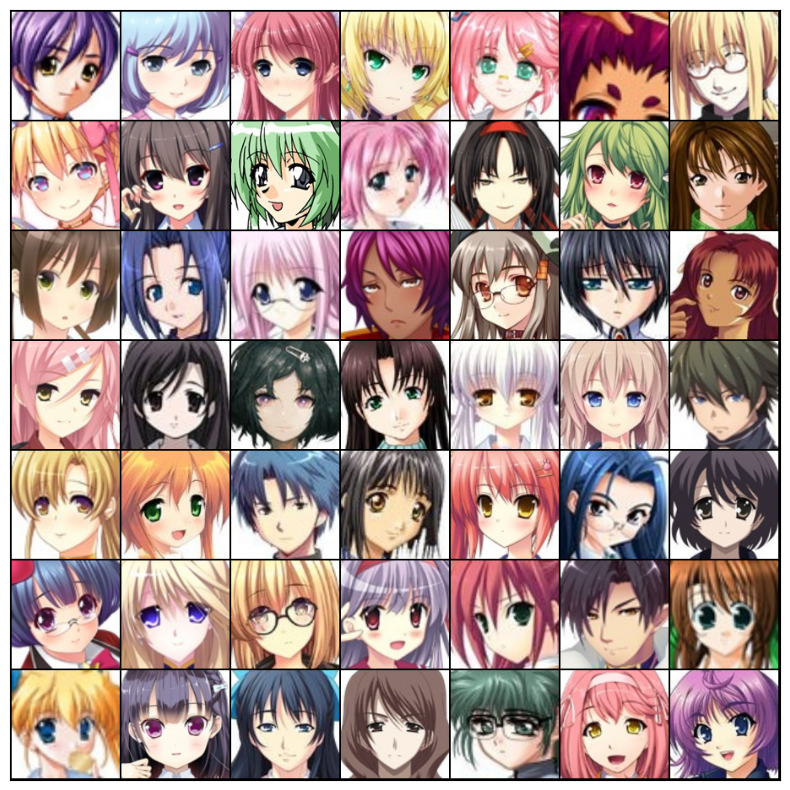

In [6]:
show_batch(train_dataset)

In [7]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [8]:
device = get_default_device()
device

device(type='cuda')

In [9]:
train_dl = DeviceDataLoader(train_dataset, device)

**DISCRIMINATOR**

In [10]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4
    
    nn.Flatten(),
    nn.Linear(512 * 4 * 4, 100),
    nn.SiLU(),

    # Sigmoid activation for classification
    nn.Linear(100, 1),
    nn.Sigmoid()
)


In [11]:
discriminator = to_device(discriminator, device)

In [12]:
num_parameters = sum(p.numel() for p in discriminator.parameters())
print("Number of parameters:", num_parameters)

Number of parameters: 8591633


**GENERATOR**

In [13]:
latent_size = 160

In [14]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU6(),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU6(),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU6(),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU6(),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU6(),   
    # out: 64 x 64 x 64
    
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128
)

In [15]:
num_parameters = sum(p.numel() for p in generator.parameters())
print("Number of parameters:", num_parameters)

Number of parameters: 8263552


torch.Size([256, 3, 128, 128])


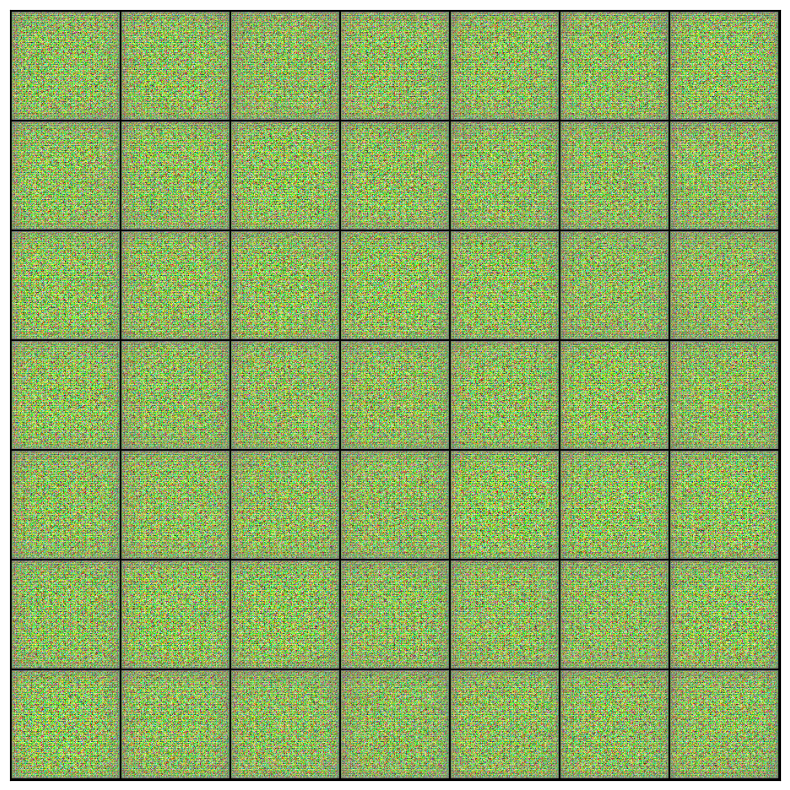

In [16]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [17]:
generator = to_device(generator, device)

In [18]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [19]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [20]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [21]:
def save_samples(index, latent_tensors, show=True):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    fake_images = generator(latent_tensors.to(device))
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname),nrow=7)
    print('Saving', fake_fname)

    if show:
        fig, ax = plt.subplots(figsize=(10, 10))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=7).permute(1, 2, 0))

In [22]:
fixed_latent = torch.randn(49, latent_size, 1, 1).to(device)

Saving generated-images-0000.png


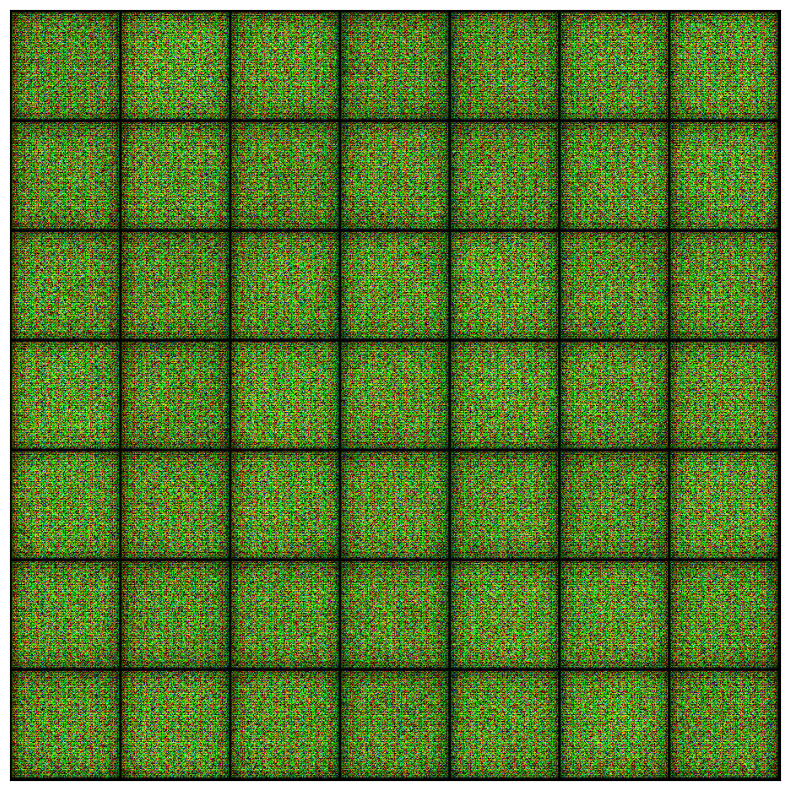

In [23]:
save_samples(0, fixed_latent)

In [24]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [25]:
lr = 0.001
epochs = 20

In [26]:
history = fit(epochs, lr)

  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 2.8080, loss_d: 0.5673, real_score: 0.6609, fake_score: 0.0905
Saving generated-images-0001.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 4.2787, loss_d: 0.6754, real_score: 0.8032, fake_score: 0.3335
Saving generated-images-0002.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 3.3548, loss_d: 0.7658, real_score: 0.7077, fake_score: 0.2699
Saving generated-images-0003.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 2.6426, loss_d: 0.3590, real_score: 0.8467, fake_score: 0.1567
Saving generated-images-0004.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 2.3079, loss_d: 0.4929, real_score: 0.8145, fake_score: 0.2258
Saving generated-images-0005.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 1.7439, loss_d: 0.8057, real_score: 0.5861, fake_score: 0.1638
Saving generated-images-0006.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 7.4045, loss_d: 1.6065, real_score: 0.9684, fake_score: 0.6811
Saving generated-images-0007.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 4.9075, loss_d: 2.7982, real_score: 0.0837, fake_score: 0.0057
Saving generated-images-0008.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 2.4170, loss_d: 0.4601, real_score: 0.7520, fake_score: 0.1288
Saving generated-images-0009.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 4.1269, loss_d: 0.9385, real_score: 0.8488, fake_score: 0.4873
Saving generated-images-0010.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 3.0304, loss_d: 1.5726, real_score: 0.2859, fake_score: 0.0270
Saving generated-images-0011.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 1.9338, loss_d: 0.8252, real_score: 0.7826, fake_score: 0.4097
Saving generated-images-0012.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 3.1413, loss_d: 2.7436, real_score: 0.1136, fake_score: 0.0043
Saving generated-images-0013.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 3.0454, loss_d: 0.3987, real_score: 0.7702, fake_score: 0.0809
Saving generated-images-0014.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 6.8657, loss_d: 1.6379, real_score: 0.8958, fake_score: 0.7075
Saving generated-images-0015.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 2.9797, loss_d: 1.2816, real_score: 0.3788, fake_score: 0.0199
Saving generated-images-0016.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 2.5306, loss_d: 0.1888, real_score: 0.9513, fake_score: 0.1095
Saving generated-images-0017.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 3.5505, loss_d: 0.4313, real_score: 0.8712, fake_score: 0.2189
Saving generated-images-0018.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 2.4962, loss_d: 0.3476, real_score: 0.8176, fake_score: 0.1070
Saving generated-images-0019.png


  0%|          | 0/249 [00:00<?, ?it/s]

Epoch [20/20], loss_g: 4.7632, loss_d: 0.6393, real_score: 0.9805, fake_score: 0.3863
Saving generated-images-0020.png


In [27]:
losses_g, losses_d, real_scores, fake_scores = history
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [28]:
from IPython.display import Image

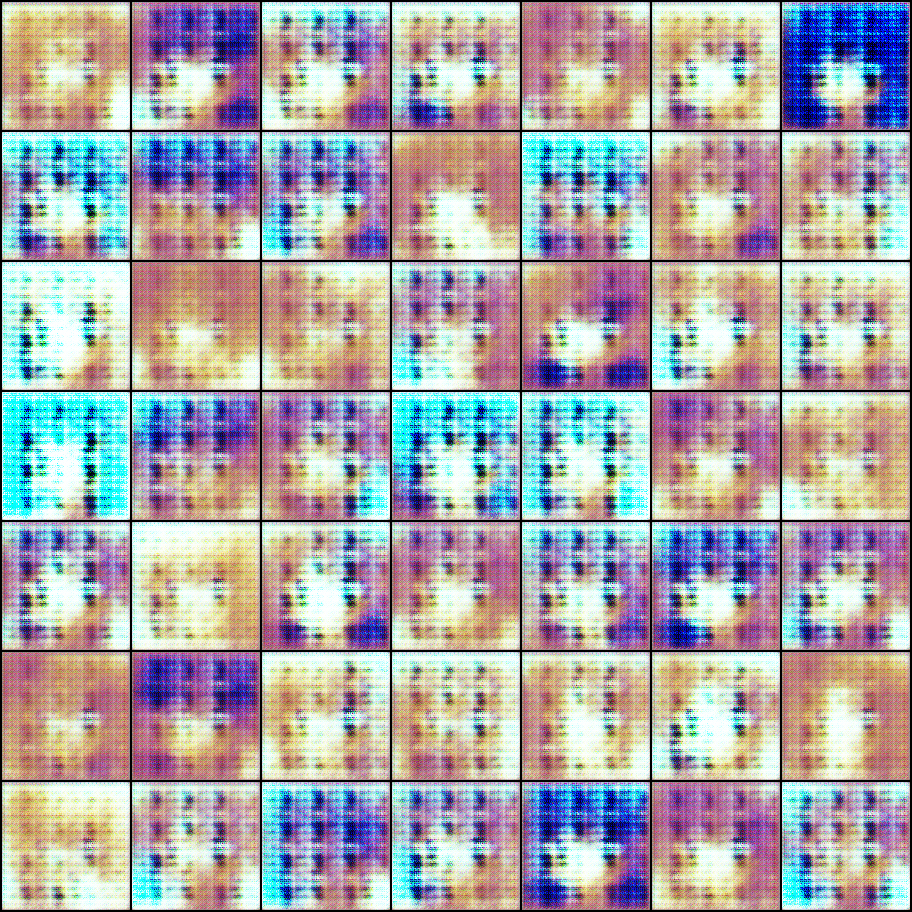

In [29]:
Image('./generated/generated-images-0001.png')

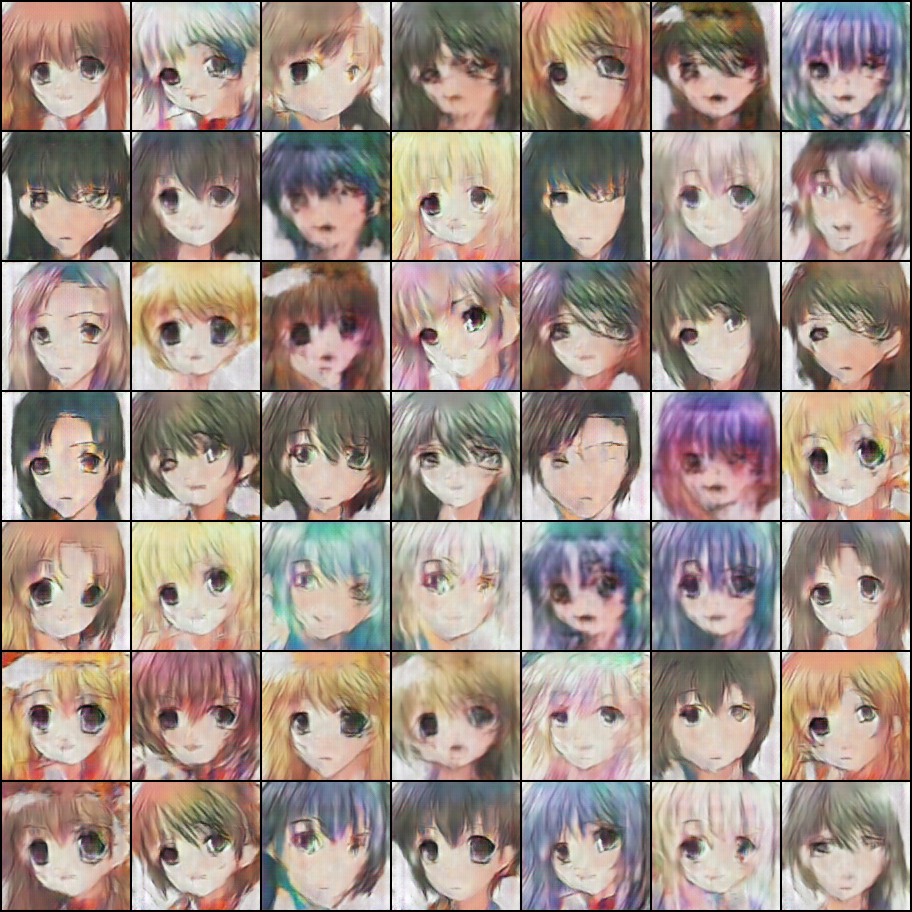

In [32]:
Image('./generated/generated-images-0020.png')

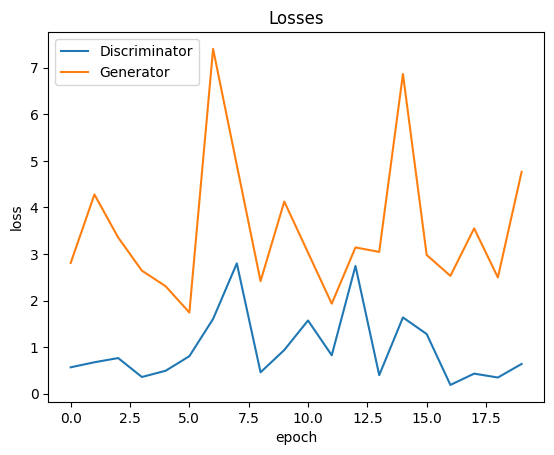

In [33]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');